# Drill String Analysis Using Base NG‑RC

This notebook analyzes the dynamics of a drill string system using the base Next Generation Reservoir Computing (NG‑RC) framework. In this analysis, we focus on the standard NG‑RC configuration (without extra parameters) to capture the system dynamics of the drill string.

In this notebook, we will:
- Simulate the drill string dynamics using the provided model.
- Prepare the dataset and build feature vectors for the NG‑RC model.
- Train the base NG‑RC model using ridge regression.
- Generate predictions for the drill string dynamics.
- Visualize the simulation results, predictions, and output weight contributions.
- Evaluate the model performance using appropriate metrics.

All necessary modules are imported from the `src` directory.


In [1]:
import sys
import os

# Add the project root to the system path so that modules in 'src' can be imported
sys.path.append(os.path.abspath('..'))

# Import required modules from the src folder
from src.models.drill_string import TorsionalLateralDrillString
from src.ngrc.ngrc_model import (
    ModelParameters, 
    DatasetDiscretization, 
    FeatureVector, 
    compute_training_prediction, 
    compute_testing_prediction, 
    calculate_metrics, 
    compute_testing_prediction_with_params
)
from src.utils.solver import simulate_dynamic_system
from src.utils.plot_helper import (
    plot_comparison, 
    plot_comparison_only_testing, 
    plot_scatter_comparison, 
    plot_phase_comparison, 
    plot_scatter_comparison_only_testing, 
    plot_phase_comparison_only_testing, 
    plot_W_out, 
    get_feature_labels
)
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import pandas as pd
import itertools

from scipy import signal
from scipy.signal import detrend
from sklearn import preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, RobustScaler, FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# Update matplotlib parameters for consistent styling
plt.rcParams.update({
    'font.size': 10,
    'lines.linewidth': 0.8,
    'figure.dpi': 300,
    'axes.grid': True,
})


## Data Preprocessing with Custom Transformers

Before training the NG‑RC model, it is crucial to preprocess the data to remove any unwanted trends that may affect model performance. In this section, we define two custom transformers:

- **DetrendTransformer:**  
  This transformer removes a linear trend from each feature (column) of the input data. It computes the slope and intercept for each column via a least-squares fit and subtracts the resulting trend. It also provides an `inverse_transform` method to reconstruct the original data by adding the trend back.

- **InvertableColumnTransformer:**  
  This transformer extends scikit-learn's `ColumnTransformer` by ensuring that the transformation can be inverted. For each column, it applies the inverse transformation from the respective sub-transformer, concatenating the results to recover the original feature space. This is especially useful when multiple column transformations have been applied.

These custom transformers help ensure that the data used for training is properly detrended and can be reverted back to its original form when needed for evaluation and interpretation.


In [7]:
class DetrendTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.coef_ = None      # Para armazenar a inclinação (slope) de cada coluna
        self.intercept_ = None # Para armazenar o intercepto de cada coluna

    def fit(self, X, y=None):
        # Converte X para um array NumPy (caso seja um DataFrame)
        X = np.asarray(X)
        n_samples, n_features = X.shape
        t = np.arange(n_samples).reshape(-1, 1)
        self.coef_ = np.zeros(n_features)
        self.intercept_ = np.zeros(n_features)
        for i in range(n_features):
            A = np.hstack([t, np.ones_like(t)])
            sol, _, _, _ = np.linalg.lstsq(A, X[:, i], rcond=None)
            self.coef_[i] = sol[0]
            self.intercept_[i] = sol[1]
        return self

    def transform(self, X):
        X = np.asarray(X)
        n_samples = X.shape[0]
        t = np.arange(n_samples).reshape(-1, 1)
        trend = t * self.coef_ + self.intercept_
        return X - trend

    def inverse_transform(self, X_transformed):
        X_transformed = np.asarray(X_transformed)
        n_samples = X_transformed.shape[0]
        t = np.arange(n_samples).reshape(-1, 1)
        trend = t * self.coef_ + self.intercept_
        return X_transformed + trend

class InvertableColumnTransformer(ColumnTransformer):
    def inverse_transform(self, X):
        if isinstance(X,pd.DataFrame):
            X = X.to_numpy()

        arrays = []
        for name, indices in self.output_indices_.items():
            transformer = self.named_transformers_.get(name, None)
            arr = X[:, indices.start: indices.stop]

            if transformer in (None, "passthrough", "drop"):
                pass

            else:
                arr = transformer.inverse_transform(arr)

            arrays.append(arr)

        retarr = np.concatenate(arrays, axis=1)

        if retarr.shape[1] != X.shape[1]:
            raise ValueError(f"Received {X.shape[1]} columns but transformer expected {retarr.shape[1]}")

        return retarr

## Simulate TLDS (Drill String) Dynamics and Select Steady-State Regime

In the following cell, we simulate the dynamics of the drill string system using the TLDS model. The simulation runs for 180 seconds with a time step of 0.01 seconds, using the 'Radau' integration method for robust performance. After the simulation, we select the steady-state regime by extracting the last 10,000 data points and adjusting the time array so that it starts at zero. Finally, we create a copy of the original steady-state data for later use.


In [5]:
# -------------------------- SIMULATE TLDS -----------------------------
dt = 0.01                             # Time step (seconds)
max_time = 180                        # Total simulation time (seconds)
t_eval = np.linspace(0, max_time, round(max_time / dt) + 1)

# System parameters for TLDS simulation
rot = 50       # Angular speed parameter (e.g., RPM or equivalent)
peso = 50      # Weight on bit parameter (N or equivalent)

# Create an instance of the TorsionalLateralDrillString model
torsional = TorsionalLateralDrillString(rot, peso)

# Initial state from the TLDS model
initial_state = torsional.initial_tlds_state

# Simulate the drill string dynamics using the Radau method
tlds_states, time_array = simulate_dynamic_system(
    torsional.tlds_rhs_solve_ivp, 
    initial_state, 
    [],         # No extra parameters for the solver
    dt, 
    max_time, 
    solve_ivp_method='Radau'
)

# Select steady-state regime by taking the last 10,000 points of the simulation
tlds_steady_state = tlds_states[:, -10000:].copy()
time_array_steady_state = time_array[-10000:].copy()

# Adjust the time array so that it starts at zero
time_array_steady_state_fixed = time_array_steady_state - time_array_steady_state[0]

# Keep a copy of the original steady-state values
tlds_steady_state_original = tlds_steady_state.copy()


## Data Preprocessing and Normalization

In this cell, we convert the steady-state simulation data into a DataFrame and define a preprocessing pipeline tailored to our drill string data. Specifically:
- The variables with a trend (i.e. "phi" and "theta") are detrended and scaled.
- The oscillatory variables (i.e. "dot_phi", "r", "dot_r", and "dot_theta") are scaled using a standard scaler.
- (Optionally, a custom pipeline for "dot_theta" is defined using a robust scaler after clipping outliers.)
- An invertible column transformer applies these transformations to the respective groups.
- Finally, the preprocessed data is rearranged into the desired order for further analysis.


In [10]:
# -------------------------- DATA PREPROCESSING --------------------------

# Convert steady-state simulation data to a DataFrame and label the columns
data = pd.DataFrame(tlds_steady_state_original.T)
data.columns = ["phi", "dot_phi", "r", "dot_r", "theta", "dot_theta"]

# Define a pipeline for variables with trend (phi and theta): detrending then standard scaling
trend_pipeline = Pipeline([
    ('detrend', DetrendTransformer()),
    ('scaler', StandardScaler())
])

# Define a pipeline for oscillatory variables (dot_phi, r, dot_r, dot_theta) using standard scaling
oscillatory_pipeline = StandardScaler()

# Define a function to clip outliers based on quantiles
def clip_outliers(X, lower_quantile=0.01, upper_quantile=0.99):
    # Calculate the lower and upper quantiles for each column
    lower = np.quantile(X, lower_quantile, axis=0)
    upper = np.quantile(X, upper_quantile, axis=0)
    return np.clip(X, lower, upper)

# Create a transformer for clipping using FunctionTransformer
clip_transformer = FunctionTransformer(clip_outliers)

# Optionally, define a pipeline for dot_theta: first clip outliers, then apply robust scaling
dot_theta_pipeline = Pipeline([
    # ('clip', clip_transformer),
    ('robust', RobustScaler())
])

# Create an invertible column transformer to apply different pipelines for each group
preprocessor = InvertableColumnTransformer(transformers=[
    ('trend', trend_pipeline, ['phi', 'theta']),
    ('oscillatory', oscillatory_pipeline, ['dot_phi', 'r', 'dot_r', 'dot_theta']),
    # ('dot_theta', dot_theta_pipeline, ['dot_theta'])  # Uncomment if using this pipeline
])

# Apply the preprocessor to the data and transpose the result for consistency
X_preprocessed = preprocessor.fit_transform(data).T

# Rearrange the preprocessed data into the desired order
normalized_tlds_steady_state = np.array([
    X_preprocessed[0],
    X_preprocessed[2],
    X_preprocessed[3],
    X_preprocessed[4],
    X_preprocessed[1],
    X_preprocessed[5]
])


## Plot TLDS Data

In the next cell, we plot ted simulation data for the TLDS (Torsional-Lateral Drill String) model. The figure is organized into 6 vertically stacked subplots (one for each state variable). For each subplot:
- The time series of the corresponding variable is plotted.
- Two regions are highlighted: a gray area for data that is discarded, and a green area for the data used for NG‑RC training.
Finally, the x-axis is labeled and a common legend is added at the top.


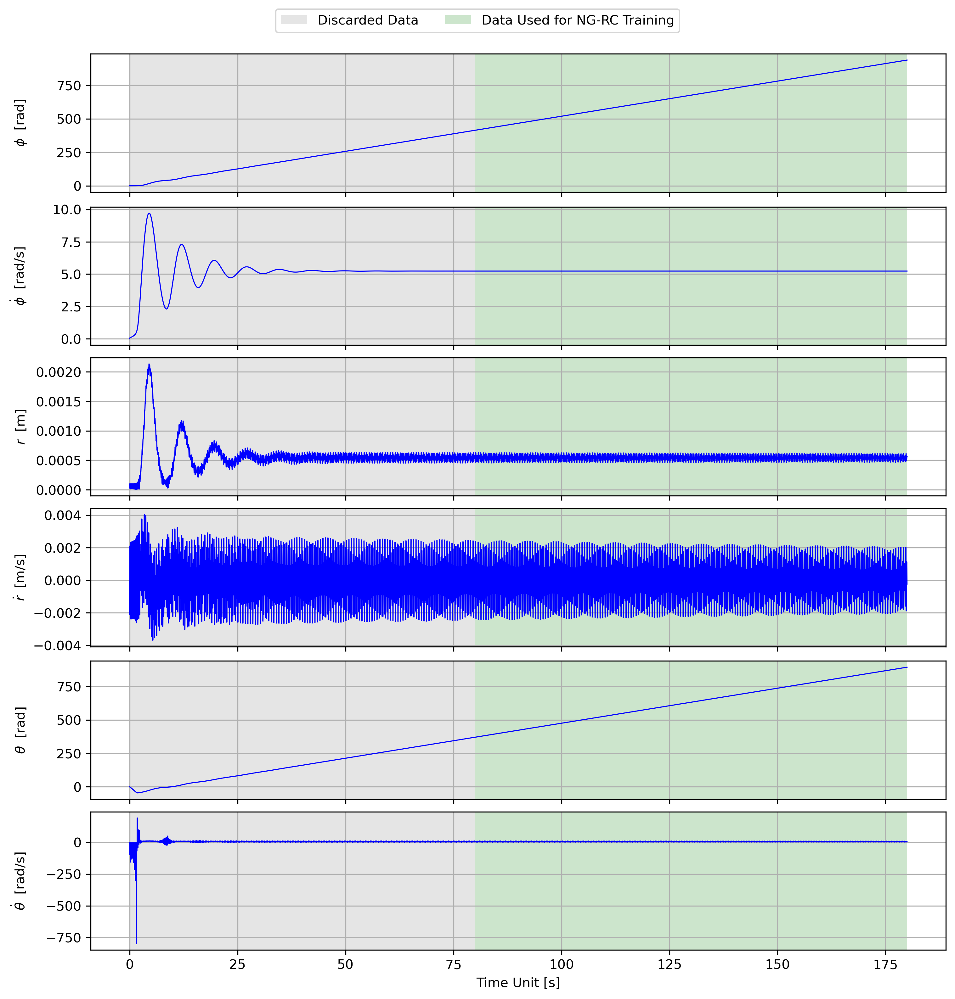

In [14]:
# -------------------------- PLOT PREPROCESSED TLDS DATA -----------------------------
fig_tlds, axs = plt.subplots(6, 1, figsize=(10, 10), sharex=True, layout='constrained')
y_labels = [r"$\phi \;$ [rad]", 
            r"$\dot{\phi} \;$ [rad/s]", 
            r"$r \;$ [m]", 
            r"$\dot{r} \;$ [m/s]", 
            r"$\theta \;$ [rad]", 
            r"$\dot{\theta} \;$ [rad/s]"]

for i, ax in enumerate(axs):
    ax.plot(t_eval, tlds_states[i], "b")
    ax.set_ylabel(y_labels[i])
    
    # Highlight the time region: gray for discarded data, green for data used for NG‑RC training
    ax.axvspan(t_eval[0], 80, facecolor='gray', alpha=0.2, label='Discarded Data')
    ax.axvspan(80, t_eval[-1], facecolor='green', alpha=0.2, label='Data Used for NG-RC Training')

# Set the x-axis label on the bottom subplot
axs[-1].set_xlabel('Time Unit [s]')

# Create a common legend and align labels
handles, labels = axs[0].get_legend_handles_labels()
fig_tlds.legend(handles, labels, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.05))
fig_tlds.align_labels()

plt.show()


## Compare Raw and Preprocessed Data

In the following cell, we plot a side-by-side comparison of the raw (untreated) data and the preprocessed (treated) data. For each of the 6 state variables, the left column shows the original steady-state values, and the right column shows the normalized valuea.


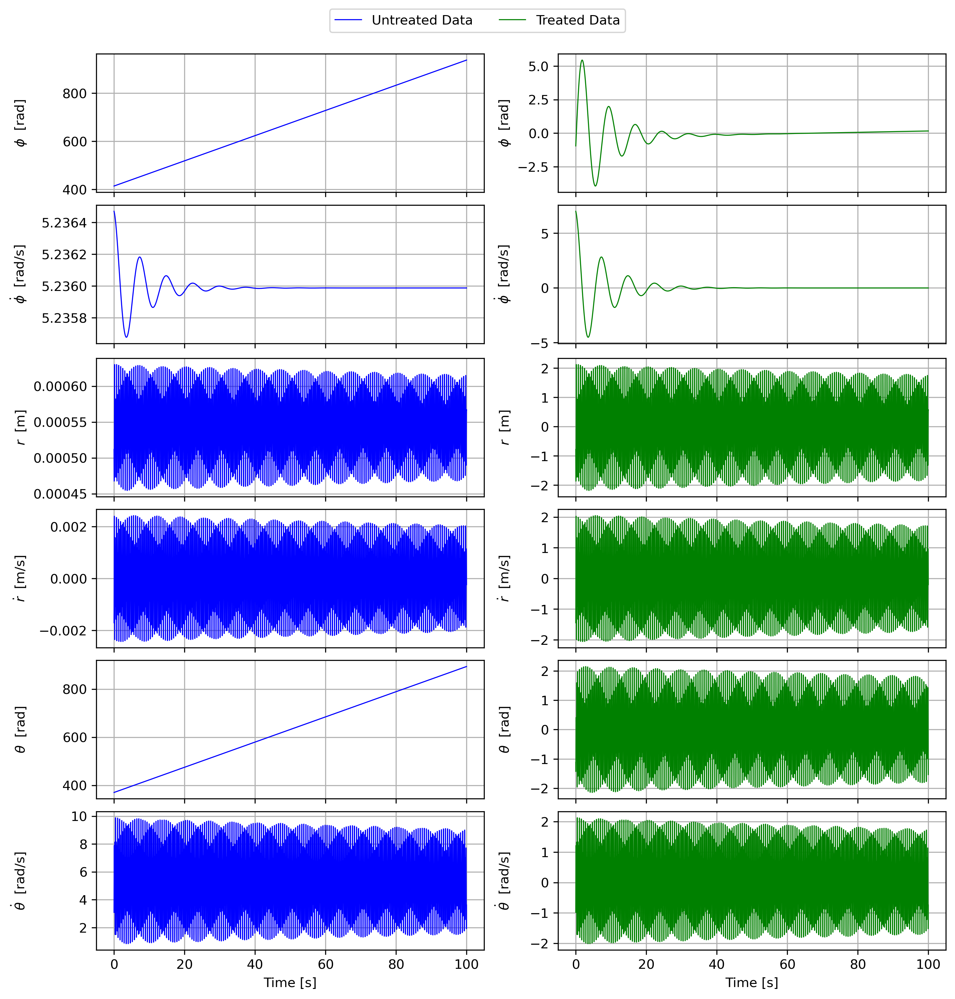

In [18]:
import matplotlib.lines as mlines  # Ensure mlines is imported for custom legend lines

# --------------------- PLOT COMPARISON BETWEEN RAW AND PREPROCESSED DATA ---------------------
fig_comparation, axs = plt.subplots(6, 2, figsize=(10, 10), sharex=True, layout='constrained')
y_labels = [r"$\phi \;$ [rad]", 
            r"$\dot{\phi} \;$ [rad/s]", 
            r"$r \;$ [m]", 
            r"$\dot{r} \;$ [m/s]", 
            r"$\theta \;$ [rad]", 
            r"$\dot{\theta} \;$ [rad/s]"]

# Plot raw (untreated) data in the left column
for i, ax in enumerate(axs):
    ax[0].plot(time_array_steady_state_fixed, tlds_steady_state_original[i], "b")
    ax[0].set_ylabel(y_labels[i])

# Plot preprocessed (treated) data in the right column
for i, ax in enumerate(axs):
    ax[1].plot(time_array_steady_state_fixed, normalized_tlds_steady_state[i], "g")
    ax[1].set_ylabel(y_labels[i])

# Set x-axis label on the bottom subplots of both columns
axs[-1][0].set_xlabel("Time [s]")
axs[-1][1].set_xlabel("Time [s]")

# Create custom legend lines for untreated (blue) and treated (green) data
line_raw = mlines.Line2D([], [], color='blue', label='Untreated Data')
line_processed = mlines.Line2D([], [], color='green', label='Treated Data')

# Insert a global legend above the subplots
fig_comparation.legend(handles=[line_raw, line_processed],
                       loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.05))

fig_comparation.align_labels()

plt.show()


## Configure NG‑RC for Drill String Analysis

In the following cell, we configure the NG‑RC model for the preprocessed drill string data. We:
- Create a `ModelParameters` object with a polynomial order of 3, an input dimension of 6 (all state variables), 3 delay taps, and no constant term.
- Discretize the dataset (using a 45/55 training/testing split) via `DatasetDiscretization`.
- Build the feature vector object using the normalized steady-state data.
- Construct the linear and full feature vectors, and calculate the total variance.
- Extract necessary discretization indices and parameters for subsequent NG‑RC processing.


In [21]:
# -------------------------- NG‑RC CONFIGURATION -----------------------------
model_params = ModelParameters(
    polynomial_order=3,
    input_dimension=6,       # 6 state variables (normalized data)
    delay_taps=3,
    include_constant=False,
    ridge_regression=1.0e-3
)

# Discretize the dataset with a 45% training and 55% testing split
dataset_disc = DatasetDiscretization(
    model_params, 
    time_array_steady_state_fixed, 
    train_percentage=45, 
    test_percentage=55
)

# Build the feature vector object for the NG‑RC model using normalized data
feature_vec_obj = FeatureVector(
    model_params, 
    normalized_tlds_steady_state, 
    dataset_disc,
    including_all_pol_combination=True
)

# Construct linear and full feature vectors from the normalized data
linear_vector = feature_vec_obj.build_linear_feature_vector()
full_vector = feature_vec_obj.build_full_feature_vector(linear_vector)

# Compute the total variance of the normalized data (sum over all state variables)
total_variance = normalized_tlds_steady_state.var(axis=1).sum()

# Extract discretization indices and parameters required for NG‑RC processing
warmup = dataset_disc.warmup_pts()
warmup_train = dataset_disc.warmup_train_pts()
train_pts = dataset_disc.train_pts()
test_pts = dataset_disc.test_pts()
input_dim = model_params.input_dimension
ridge_param = model_params.ridge_regression


## NG‑RC Prediction in Training and Testing Periods

In the next cell, we generate NG‑RC predictions for both the training and testing phases:

- **Training Prediction:**  
  We compute the output weights and obtain the training predictions using `compute_training_prediction`. Then, we extract the true and predicted values along with the corresponding time vector for the training period.

- **Testing Prediction:**  
  We generate predictions for the testing phase using `compute_testing_prediction` and similarly extract the true and predicted values and their time vector.

These predictions will be used later for validation and visualization.


In [24]:
# --------------------- TRAINING PERIOD PREDICTION ----------------------
W_out, X_predict = compute_training_prediction(
    linear_vector, full_vector, warmup, warmup_train, train_pts, input_dim, ridge_param
)
y_true_train = linear_vector[0:input_dim, warmup:warmup_train]
y_pred_train = X_predict
t_train = time_array_steady_state_fixed[warmup:warmup_train]

# --------------------- TESTING PERIOD PREDICTION -----------------------
x_test = compute_testing_prediction(
    linear_vector, feature_vec_obj, W_out, warmup_train, test_pts, input_dim
)
y_true_test = linear_vector[0:input_dim, warmup_train - 1:-1]
y_pred_test = x_test[0:input_dim, :]
t_test = time_array_steady_state_fixed[warmup_train - 1:-1]


## Compute Performance Metrics and Visualize Results

In the next cell, we:
- Calculate key performance metrics (RMSE, NRMSE, MAE, R², MAPE) for the NG‑RC predictions using the `calculate_metrics` function.
- Organize these metrics into a DataFrame and print them.
- Generate various plots (e.g., time series, scatter plots, phase plots) that compare the NG‑RC predictions with the true data for both the training and testing periuracy.


In [29]:
metrics_train = calculate_metrics(y_true_train, y_pred_train, total_variance)
metrics_test = calculate_metrics(y_true_test, y_pred_test, total_variance)

metrics_df = pd.DataFrame({
    "Fase": ["Treinamento", "Teste"],
    "RMSE": [metrics_train["RMSE"], metrics_test["RMSE"]],
    "NRMSE": [metrics_train["NRMSE"], metrics_test["NRMSE"]],
    "MAE": [metrics_train["MAE"], metrics_test["MAE"]],
    "R²": [metrics_train["R2"], metrics_test["R2"]],
    "MAPE (%)": [metrics_train["MAPE (%)"], metrics_test["MAPE (%)"]]
})
print("\nMétricas de desempenho:")
print(metrics_df.to_string())


Métricas de desempenho:
          Fase      RMSE     NRMSE       MAE        R²    MAPE (%)
0  Treinamento  0.000176  0.000072  0.000097  1.000000    0.052032
1        Teste  0.036091  0.014734  0.024604  0.997868  128.740546


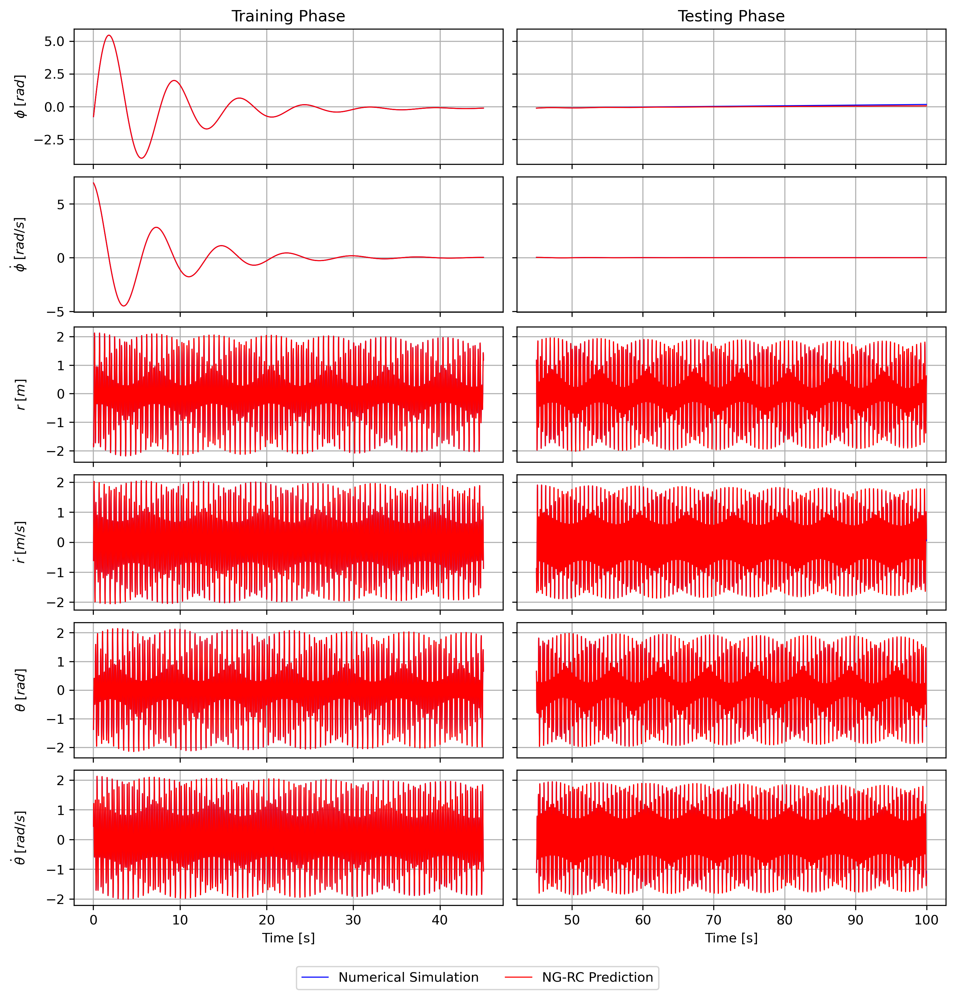

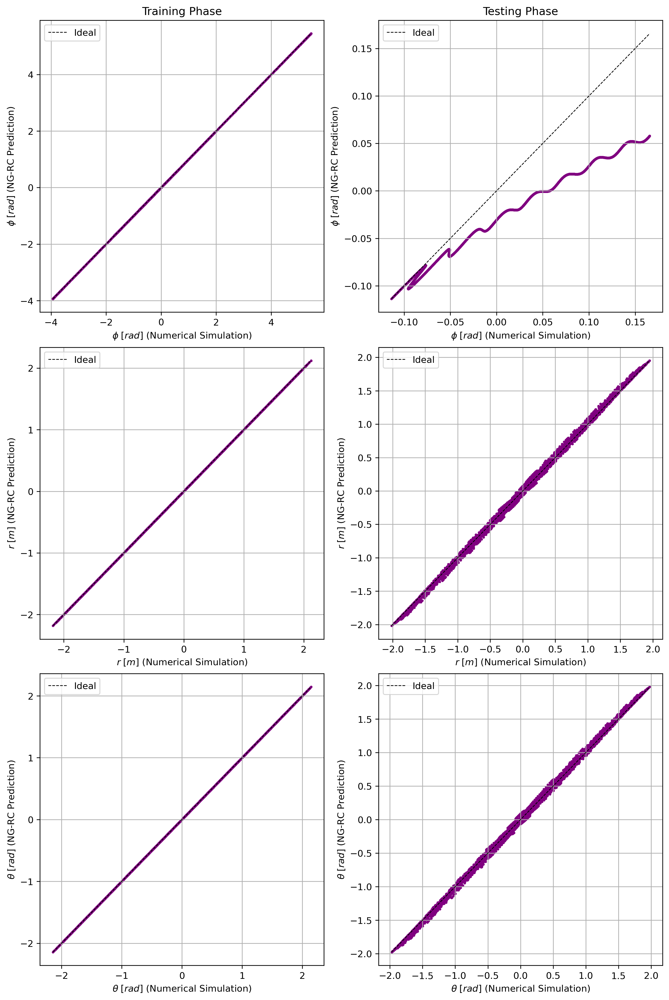

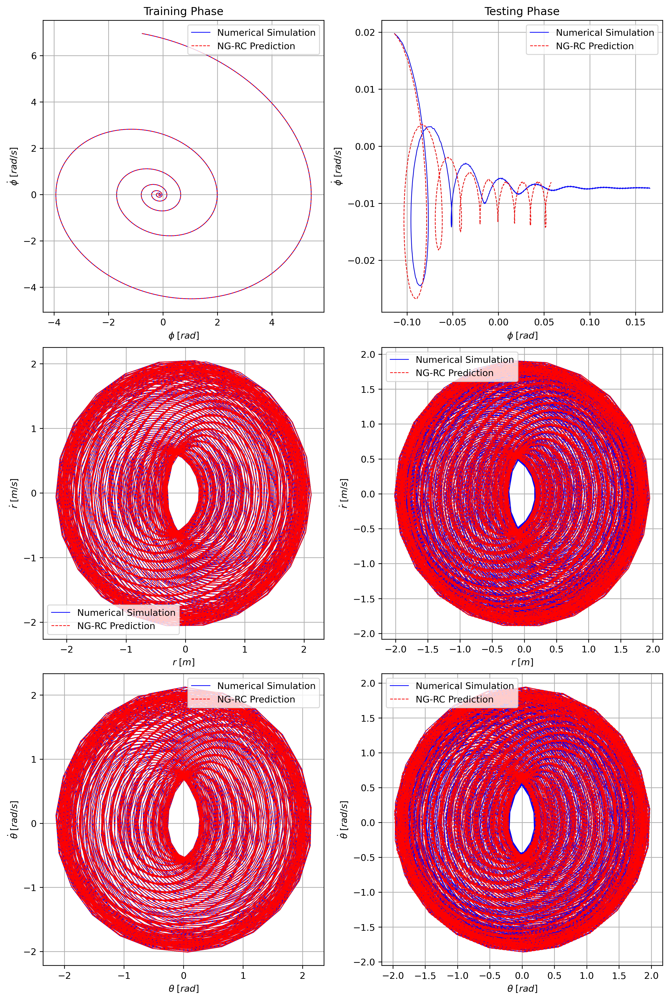

In [31]:
labels_full = [r"$\phi \; [rad]$", r"$\dot{\phi} \; [rad/s]$", r"$r \; [m]$", r"$\dot{r} \; [m/s]$", r"$\theta \; [rad]$", r"$\dot{\theta} \; [rad/s]$"]

plot_comparison = plot_comparison(y_true_train, y_pred_train, t_train,
                           y_true_test, y_pred_test, t_test, labels_full)

labels_scatter = [labels_full[0], labels_full[2], labels_full[4]]
properties_scatter_idx = [0, 2, 4]
plot_scatter_comparison = plot_scatter_comparison(y_true_train, y_pred_train,
                           y_true_test, y_pred_test, properties_scatter_idx, labels_scatter)

labels_phase = [
    [labels_full[0], labels_full[1]], 
    [labels_full[2], labels_full[3]],
    [labels_full[4], labels_full[5]]
]
properties_phase_idx = [
    [0, 1], 
    [2, 3],
    [4, 5]
]
plot_phase_comparison = plot_phase_comparison(y_true_train, y_pred_train,
                           y_true_test, y_pred_test, properties_phase_idx, labels_phase)